In [2]:
import json
import nltk
from nltk.translate.bleu_score import sentence_bleu
nltk.download('punkt')
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from transformers import pipeline
from textblob import TextBlob
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import numpy as np
import spacy


%matplotlib inline

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
# Step 1: Load the data from JSON
with open("resultsNoNames.json", 'r') as json_file:
    data = json.load(json_file)

In [4]:
# Initialize lists to store existing and generated texts
existing_texts = []
generated_texts = []

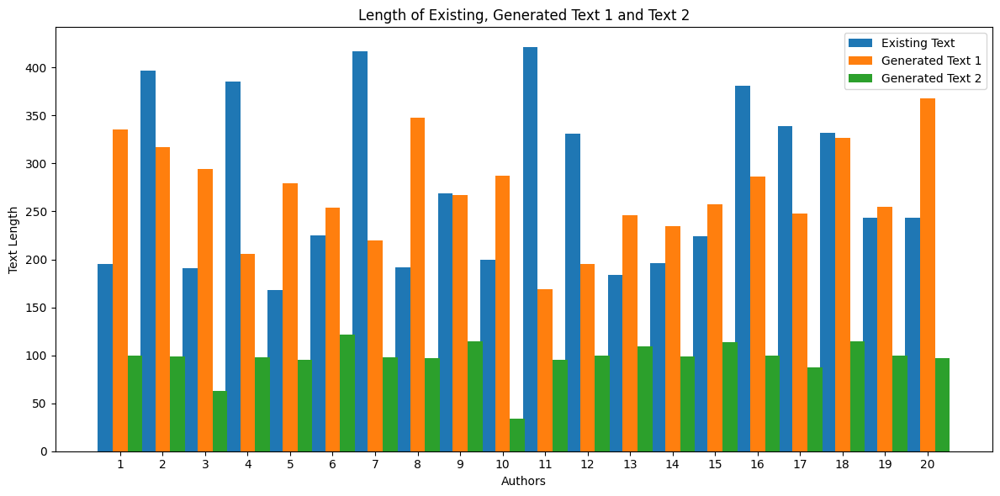

In [9]:

# Initialize lists to store text lengths
existing_lengths = []
generated_lengths = []
generated2_lengths = []

# Iterate over each entry in the JSON data
for i, entry in enumerate(data):
    existing_text = entry['existing_text']
    generated_text = entry['generated_text1']
    generated2_text = entry['generated_text2']
   

    # Get the lengths of existing, generated, and generated2 texts
    existing_length = len(existing_text)
    generated_length = len(generated_text)
    generated2_length = len(generated2_text)
 

    # Append text lengths to respective lists
    existing_lengths.append(existing_length)
    generated_lengths.append(generated_length)
    generated2_lengths.append(generated2_length)
  

# Set up the bar chart
x = range(len(data))
width = 0.35
plt.figure(figsize=(12, 6))

# Plot the lengths of existing, generated, and generated2 texts
plt.bar(x, existing_lengths, width, label='Existing Text')
plt.bar([val + width for val in x], generated_lengths, width, label='Generated Text 1')
plt.bar([val + width*2 for val in x], generated2_lengths, width, label='Generated Text 2')


# Set the labels and title
plt.xlabel('Authors')
plt.ylabel('Text Length')
plt.title('Length of Existing, Generated Text 1 and Text 2')

# Set the x-axis tick labels as entry numbers
plt.xticks([val + width for val in x], range(1, len(data) + 1))

# Add a legend
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

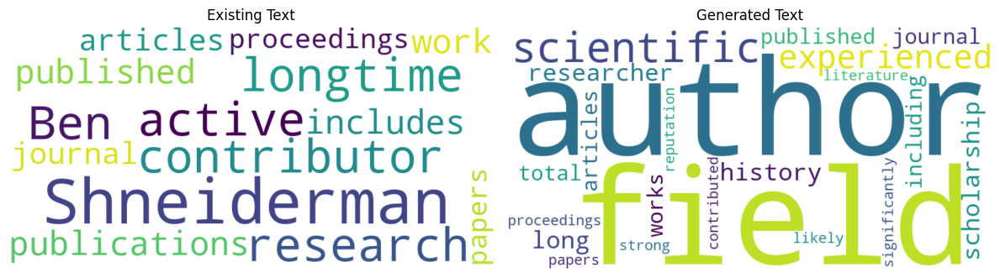

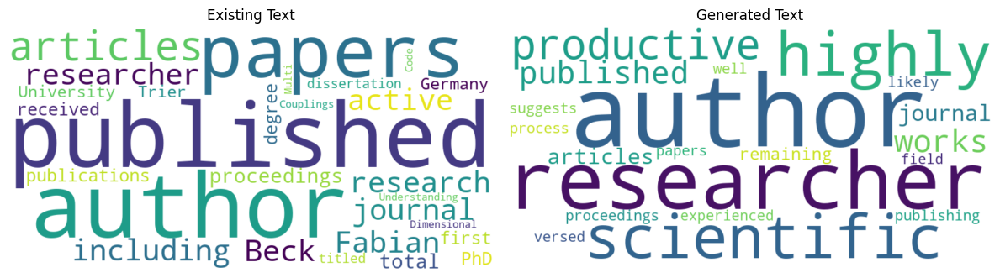

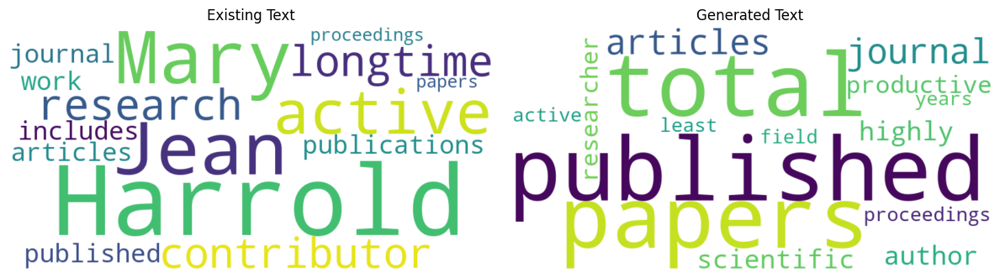

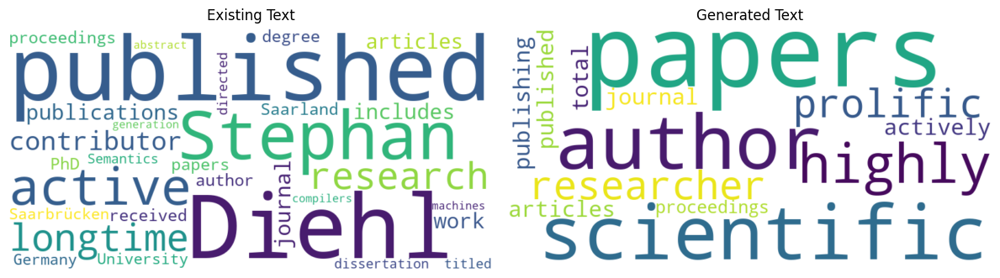

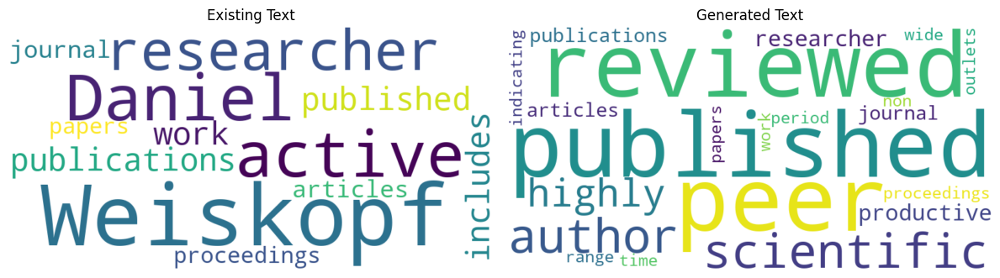

...

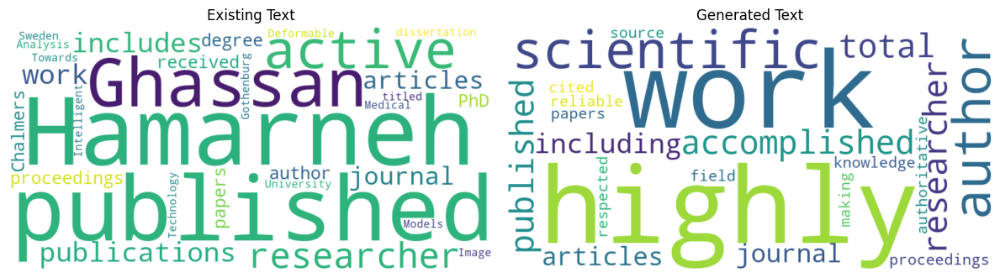

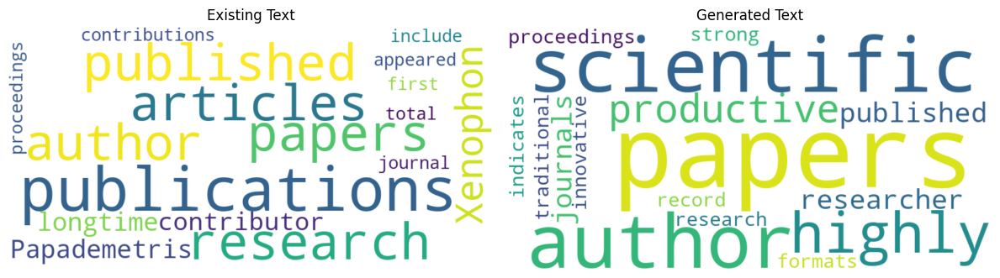

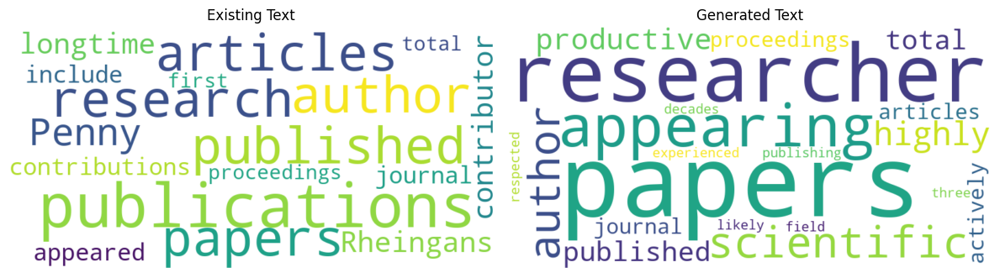

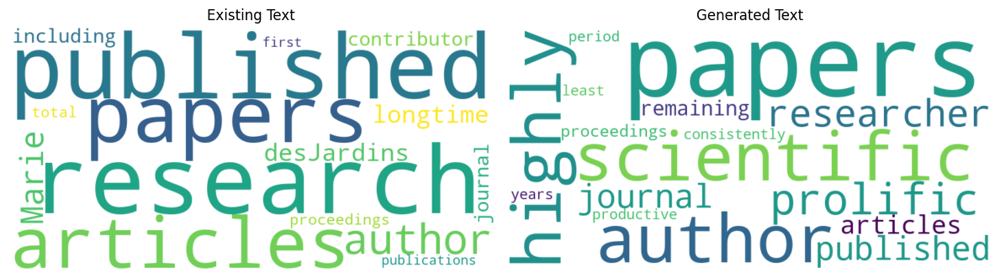

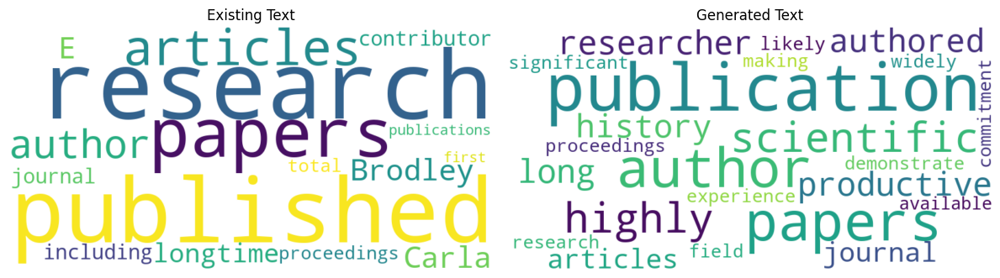

In [8]:
# Extract the existing and generated texts from the JSON data
for entry in data:
    existing_texts.append(entry['existing_text'])
    generated_texts.append(entry['generated_text1'])

# Generate word clouds for each pair of texts
for i in range(len(existing_texts)):
    existing_text = existing_texts[i]
    generated_text = generated_texts[i]

    # Generate word cloud for the existing text
    existing_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(existing_text)

    # Generate word cloud for the generated text
    generated_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(generated_text)

    # Plot the word clouds
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    axes[0].imshow(existing_wordcloud, interpolation='bilinear')
    axes[0].set_title('Existing Text')
    axes[0].axis('off')

    axes[1].imshow(generated_wordcloud, interpolation='bilinear')
    axes[1].set_title('Generated Text')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()